# **Introduction**

| - | Description |
| --- | --- |
|Nama                 | Mia Yulia Nurrizky   |                    
|Batch                | HCK 006               |                
|Objective            | Perusahaan Farm to Live (FTL) ingin melakukan efisiensi SDM dan meminta tim data scientist untuk membuat model pendeteksi jenis sayuran untuk mengurangi SDM yang memilah sayur untuk di buat ke dalam packs penjualan. |                                     
|Dataset              | *https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset* |

# **Import Library**

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np

#load data
from google.colab import files
import random

#modelling
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, BatchNormalization
from sklearn.metrics import classification_report

# **Data Loading**

In [2]:
#import kaggle's token
!pip install -q kaggle
uploaded = files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle
!ls -l ~/.kaggle
!cat ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle (1).json
kaggle.json
total 4
-rw------- 1 root root 72 Aug  5 08:08 kaggle.json
{"username":"miayulianurrizky","key":"aeb8891401ba3f094f66500ab6475ea6"}

In [3]:
#download dataset
!kaggle datasets download -d misrakahmed/vegetable-image-dataset

vegetable-image-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
#unzip dataset
!unzip -q /content/vegetable-image-dataset.zip

# **EDA**

In [5]:
#get images
train_datagen = ImageDataGenerator(rescale=1./255.)
test_datagen = ImageDataGenerator(rescale=1./255.)
val_datagen = ImageDataGenerator(rescale=1./255.)

#see how many images and classes in this dataset
print('Train Set')
train_gen = train_datagen.flow_from_directory(
	"/content/Vegetable Images/train",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126
)

print('\nTest Set')
test_gen = test_datagen.flow_from_directory(
	"/content/Vegetable Images/test",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle = False
)

print('\nVal Set')
val_gen = val_datagen.flow_from_directory(
	"/content/Vegetable Images/validation",
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle = False
)

Train Set
Found 15000 images belonging to 15 classes.

Test Set
Found 3000 images belonging to 15 classes.

Val Set
Found 3000 images belonging to 15 classes.


terdapat 15.000 gambar pada train set, 3.000 gambar masing-masing pada test set dan validation set. pada data ini ada 15 jenis sayuran yang akan dilakukan modelling dan prediksi.

In [6]:
train_dir = '/content/Vegetable Images/train'
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=0,
  image_size=(150, 150),
  batch_size=15)

#show class names
class_names = train_ds.class_names
class_names

Found 15000 files belonging to 15 classes.


['Bean',
 'Bitter_Gourd',
 'Bottle_Gourd',
 'Brinjal',
 'Broccoli',
 'Cabbage',
 'Capsicum',
 'Carrot',
 'Cauliflower',
 'Cucumber',
 'Papaya',
 'Potato',
 'Pumpkin',
 'Radish',
 'Tomato']

15 jenis/kelas sayuran tersebut terdiri dari `Bean, Bitter_Gourd, Bottle_Gourd Brinjal, Broccoli, Cabbage, Capsicum, Carrot, Cauliflower, Cucumber, Papaya, Potato, Pumpkin, Radish, dan Tomato`. Selanjutnya akan dilakukan sampling gambar yang menunjukkan bentuk sayuran dari masing-masing kelas.

Bean


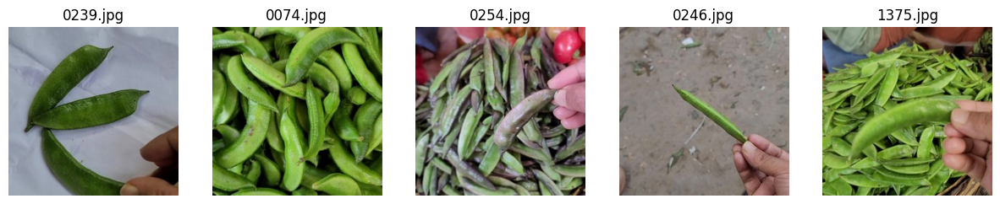

Bitter_Gourd


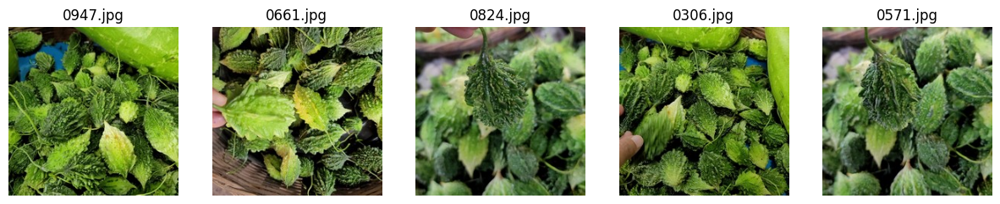

Bottle_Gourd


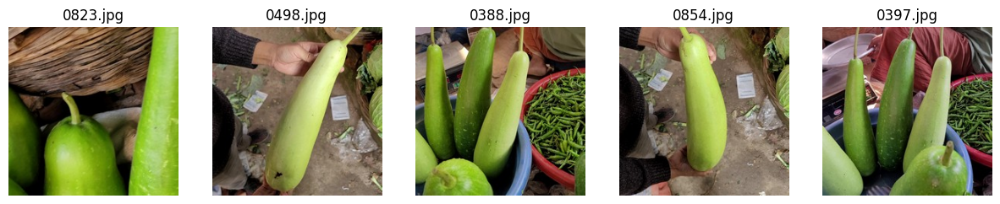

Brinjal


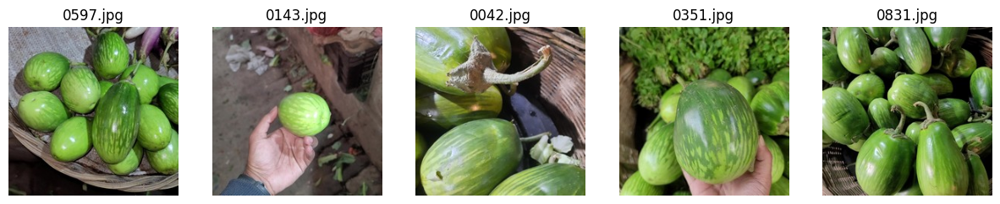

Broccoli


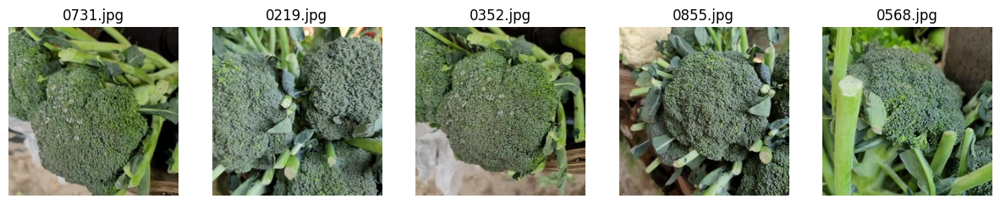

Cabbage


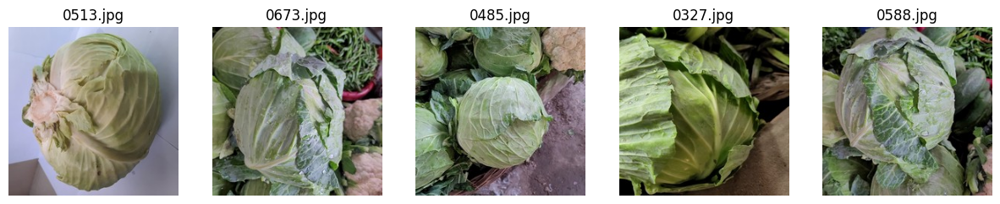

Capsicum


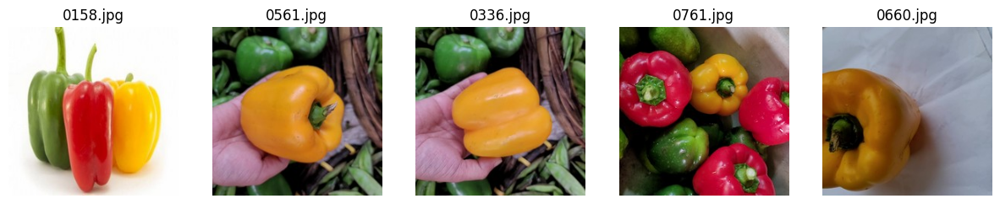

Carrot


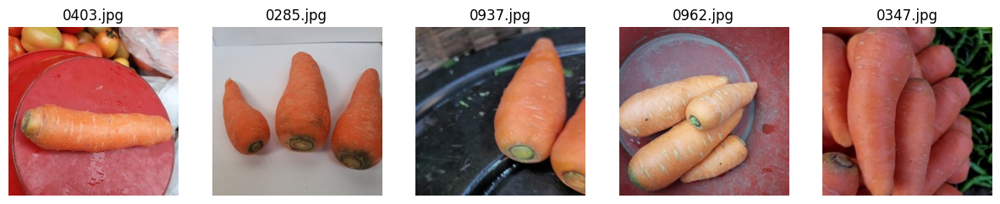

Cauliflower


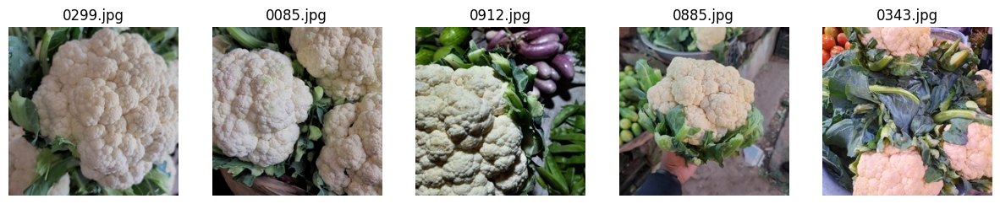

Cucumber


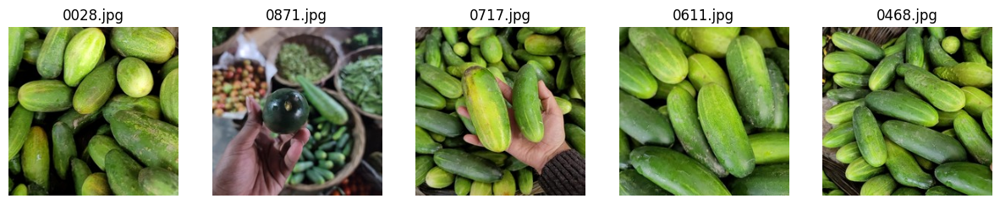

Papaya


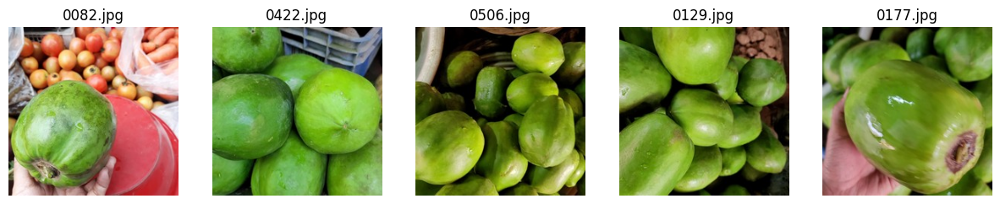

Potato


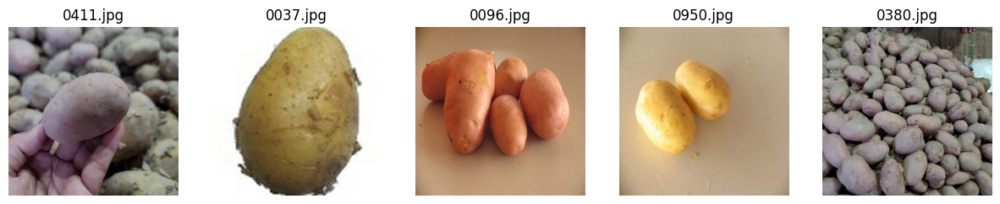

Pumpkin


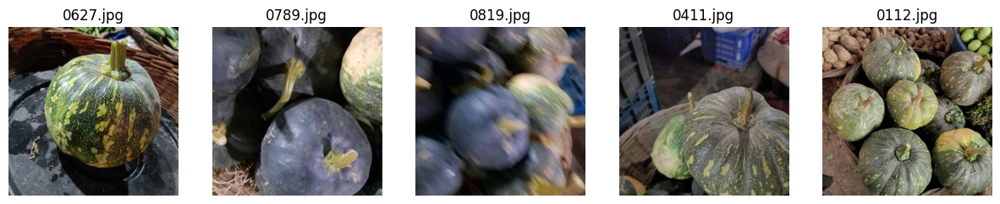

Radish


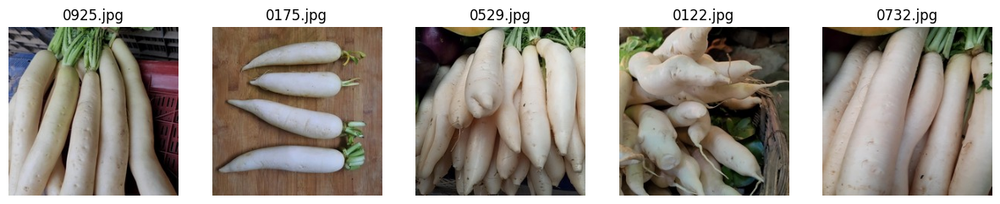

Tomato


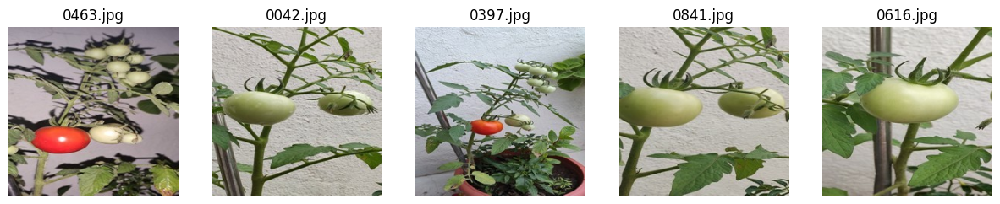

In [7]:
#file direction
file_path = '/content/Vegetable Images/train'

#defining function
def show_images_from_folder_with_title(folder_path, num_images=5):
    plt.figure(figsize=(15, 8))
    image_files = os.listdir(folder_path)
    for i in range(num_images):
        random_image = random.choice(image_files)
        img_path = os.path.join(folder_path, random_image)
        img = plt.imread(img_path)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(random_image)
        plt.axis('off')
    plt.show()

#visualize
print('Bean')
bean_folder = os.path.join(file_path, 'Bean')
show_images_from_folder_with_title(bean_folder, num_images=5)
print('Bitter_Gourd')
bittergourd_folder = os.path.join(file_path, 'Bitter_Gourd')
show_images_from_folder_with_title(bittergourd_folder, num_images=5)
print('Bottle_Gourd')
bottlegourd_folder = os.path.join(file_path, 'Bottle_Gourd')
show_images_from_folder_with_title(bottlegourd_folder, num_images=5)
print('Brinjal')
brinjal_folder = os.path.join(file_path, 'Brinjal')
show_images_from_folder_with_title(brinjal_folder, num_images=5)
print('Broccoli')
broccoli_folder = os.path.join(file_path, 'Broccoli')
show_images_from_folder_with_title(broccoli_folder, num_images=5)
print('Cabbage')
cabbage_folder = os.path.join(file_path, 'Cabbage')
show_images_from_folder_with_title(cabbage_folder, num_images=5)
print('Capsicum')
capsicum_folder = os.path.join(file_path, 'Capsicum')
show_images_from_folder_with_title(capsicum_folder, num_images=5)
print('Carrot')
carrot_folder = os.path.join(file_path, 'Carrot')
show_images_from_folder_with_title(carrot_folder, num_images=5)
print('Cauliflower')
cauliflower_folder = os.path.join(file_path, 'Cauliflower')
show_images_from_folder_with_title(cauliflower_folder, num_images=5)
print('Cucumber')
cucumber_folder = os.path.join(file_path, 'Cucumber')
show_images_from_folder_with_title(cucumber_folder, num_images=5)
print('Papaya')
papaya_folder = os.path.join(file_path, 'Papaya')
show_images_from_folder_with_title(papaya_folder, num_images=5)
print('Potato')
potato_folder = os.path.join(file_path, 'Potato')
show_images_from_folder_with_title(potato_folder, num_images=5)
print('Pumpkin')
pumpkin_folder = os.path.join(file_path, 'Pumpkin')
show_images_from_folder_with_title(pumpkin_folder, num_images=5)
print('Radish')
radish_folder = os.path.join(file_path, 'Radish')
show_images_from_folder_with_title(radish_folder, num_images=5)
print('Tomato')
tomato_folder = os.path.join(file_path, 'Tomato')
show_images_from_folder_with_title(tomato_folder, num_images=5)

masing-masing kelas memiliki gambar yang bervariasi dari angle gambar dan bentuk tertentu untuk dilatih pada model agar nantinya model dapat mengenali/memprediksi jenis sayuran yang tepat. Terdapat beberapa sayuran yang memiliki bentuk mirip (lonjong dan hijau) seperti `papaya, cucumber, brinjal, bottle gourd, and beans`. kemudian sayuran yang memiliki bentuk mirip lainnya adalah `broccoli and cauliflower`. Namun meskipun mirip, tiap sayuran memiliki karakteristik masing-masing seperti guratan, bintik-bintik, warna, dan tekstur yang berbeda.

# **Modelling**

### Sequential

In [8]:
#model definition
models = tf.keras.models.Sequential()

models.add(tf.keras.layers.Conv2D(32, (3,3),activation='relu', input_shape=(150, 150, 3)))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu'))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.Conv2D(128, (3,3),activation='relu'))
models.add(tf.keras.layers.MaxPooling2D(2, 2))
models.add(tf.keras.layers.GlobalAveragePooling2D())
models.add(tf.keras.layers.Dropout(0.5))
models.add(tf.keras.layers.Dense(512, activation='relu'))
models.add(tf.keras.layers.Dense(15, activation='softmax'))

In [9]:
#show model summary
models.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

Pada tahap ini, dilakukan model `sequential` untuk memproses layer secara berurutan dengan menggabungkan :
  - lapisan konvolusi 2D dalam 3 layer yang masing-masing terdiri dari  32, 64, dan 128 filter dimana setiap filter berukuran 3x3 dan menggunakan fungsi aktivasi `relu`.
  - `global average pooling 2D` layer  untuk reduksi dimensi
  - dropout sebesar 0.5 untuk mencegah overfitting, ditambahkan.
  - fully connected layer sebanyak 512 neuron dengan aktivasi `relu` dan output dengan aktivasi `softmax` sebanyak 15 neuron yang menggambarkan jumlah kelas.

In [10]:
# train model

models.compile(loss = 'categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

history = models.fit(train_gen, epochs=50, steps_per_epoch=30, validation_data = val_gen, verbose = 1, validation_steps=10)

Epoch 1/50
30/30 [==============================] - 23s 285ms/step - loss: 2.6517 - accuracy: 0.0997 - val_loss: 2.5467 - val_accuracy: 0.0817
Epoch 2/50
30/30 [==============================] - 8s 267ms/step - loss: 2.2798 - accuracy: 0.2096 - val_loss: 2.2701 - val_accuracy: 0.2468
Epoch 3/50
30/30 [==============================] - 9s 284ms/step - loss: 2.0909 - accuracy: 0.2624 - val_loss: 2.1828 - val_accuracy: 0.2730
Epoch 4/50
30/30 [==============================] - 11s 364ms/step - loss: 1.9765 - accuracy: 0.3029 - val_loss: 2.1094 - val_accuracy: 0.2048
Epoch 5/50
30/30 [==============================] - 8s 282ms/step - loss: 1.9288 - accuracy: 0.3246 - val_loss: 1.9146 - val_accuracy: 0.2611
Epoch 6/50
30/30 [==============================] - 9s 300ms/step - loss: 1.8628 - accuracy: 0.3466 - val_loss: 2.2006 - val_accuracy: 0.1992
Epoch 7/50
30/30 [==============================] - 8s 274ms/step - loss: 1.8067 - accuracy: 0.3783 - val_loss: 2.0404 - val_accuracy: 0.3627
Epoc

Dilakukan training model terhadap data training dan data validasi dengan sebanyak 50 epoch dan menampilkan nilai loss dengan metode `categorical_crossentropy`, dan nilai metrics `accuracy`

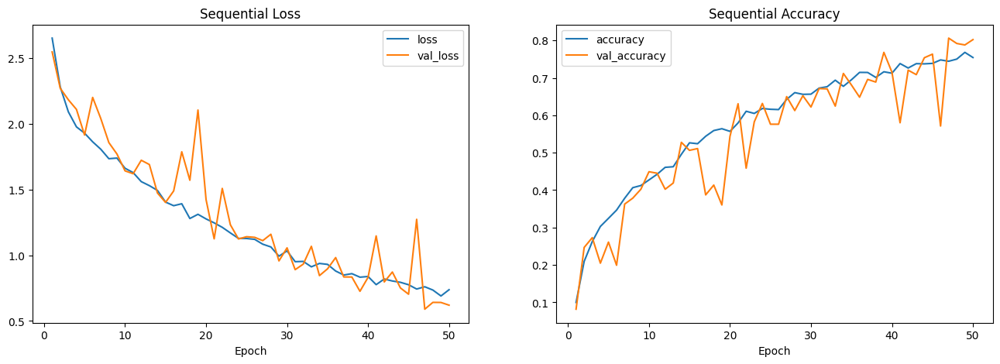

In [11]:
#shows loss and accuracy graph

epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history.history['val_loss'],label='val_loss')
ax[0].set_title('Sequential Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')

ax[1].plot(range(1,epoch+1),history.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Sequential Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')

plt.show()

berdasarkan grafik yang ditampilkan, performa model menunjukkan hasil yang goodfit namun terdapat gradient problem yaitu exploding pada data validasi.

In [12]:
#train evaluation
trains_loss, trains_acc = models.evaluate(train_gen)
print(f'Train loss Sequential: {trains_loss:.4f}')
print(f'Train accuracy Sequential: {trains_acc:.4f}')

#val evaluation
vals_loss, vals_acc = models.evaluate(val_gen)
print(f'Val loss Sequential: {vals_loss:.4f}')
print(f'Val accuracy Sequential: {vals_acc:.4f}')

120/120 [==============================] - 23s 187ms/step - loss: 0.4615 - accuracy: 0.8569
Train loss Sequential: 0.4615
Train accuracy Sequential: 0.8569
24/24 [==============================] - 5s 227ms/step - loss: 0.4904 - accuracy: 0.8503
Val loss Sequential: 0.4904
Val accuracy Sequential: 0.8503


Diketahui bahwa pada train-set, model sequential memiliki nilai loss 0.46 dan nilai akurasi 0.85. sedangkan pada val-set nilai lossnya yaitu 0.49 dan nilai akurasinya 0.82. Hasil ini menunjukkan model memiliki kesalahan eror sebanyak 50% dan akurasi 85% dengan performa goodfit.

In [13]:
#shows classification report from test-set
preds = models.predict(test_gen)
preds = np.argmax(preds, axis=1)
true = test_gen.labels

print(classification_report(true,preds))

24/24 [==============================] - 4s 173ms/step
              precision    recall  f1-score   support

           0       0.84      0.75      0.79       200
           1       0.88      0.77      0.82       200
           2       0.72      0.92      0.81       200
           3       0.82      0.78      0.80       200
           4       0.99      0.74      0.85       200
           5       0.81      0.91      0.85       200
           6       0.98      0.95      0.97       200
           7       0.96      1.00      0.98       200
           8       0.88      0.83      0.86       200
           9       0.79      0.88      0.83       200
          10       0.78      0.80      0.79       200
          11       0.98      0.97      0.97       200
          12       0.84      0.92      0.88       200
          13       0.83      0.96      0.89       200
          14       0.98      0.81      0.89       200

    accuracy                           0.87      3000
   macro avg       0.87  

Pada test-set, model memiliki nilai akurasi sebesar 87% dimana hasil akurasi lebih tinggi daripada train dan val set.

#### Predict

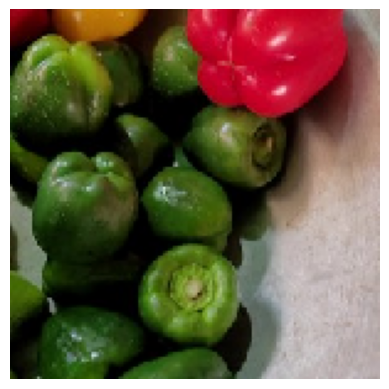

1/1 [==============================] - 0s 195ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Max Class  :  6
Class Name :  Capsicum



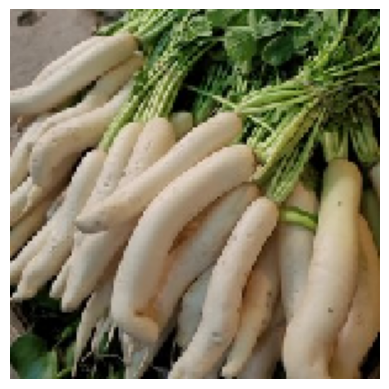

1/1 [==============================] - 0s 21ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Max Class  :  13
Class Name :  Radish



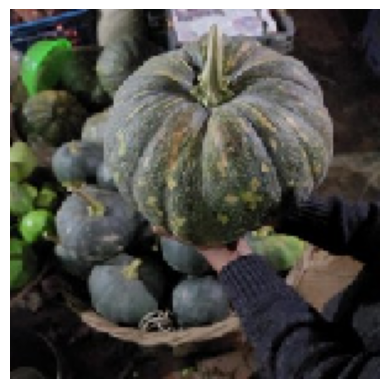

1/1 [==============================] - 0s 18ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Max Class  :  8
Class Name :  Cauliflower



In [14]:
# define image size
img_height = 150
img_width = 150

# choose random images from test-set
img_paths = ['/content/Vegetable Images/test/Capsicum/1004.jpg',
             '/content/Vegetable Images/test/Radish/1043.jpg',
             '/content/Vegetable Images/test/Pumpkin/1129.jpg']

for filename in img_paths:
  img = image.load_img(filename, target_size=(img_height, img_width))
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_batch = np.expand_dims(img_array, axis=0)

  #predict
  prediction = models.predict(img_batch)
  result_max_proba = prediction.argmax(axis=-1)[0]
  result_class = class_names[result_max_proba]

  print('Result     : ', prediction)
  print('Max Class  : ', result_max_proba)
  print('Class Name : ', result_class)
  print('')

Dari 3 gabar yaitu Capsicum, Radish, and Pumpkin, model dapat memprediksi benar 2 gambar yaitu Capsicum dan Radish. sedangkan pada gambar Pumpkin model memprediksi salah sebagai Cauliflower.

## **Model Improvement**

Hasil dari prediksi dan nilai akurasi menunjukkan bahwa model masih kurang optimal. Selanjutnya akan dilakukan pemodelan menggunakan pre-train model yaitu `VGG16`. Model ini memiliki kemampuan ektraksi fitur yang baik yang dapat membantu model untuk belajar terhadap data/fitur yang kompleks seperti gambar. Selain itu, model VGG telah terbukti di beberapa pemodelan menggunakan data gambar dalam kompetisi ilmiah dan menghasilkan nilai akurasi yang tinggi. 

### VGG16

In [15]:
#clear session
tf.keras.backend.clear_session()

In [16]:
# Import Library
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing import image

In [17]:
#define image size
img_height = 255
img_width = 255
inputs= [img_height,img_width,3]

In [18]:
#download VGG model
base_model = VGG16(include_top = False, weights = 'imagenet', input_shape = inputs)
base_model.trainable = False

58889256/58889256 [==============================] - 2s 0us/step


In [19]:
#model definition
base_model = Sequential([base_model,
                         GlobalAveragePooling2D(),
                         Dense(512, activation = 'relu'),
                         BatchNormalization(),
                         Dropout(0.3),
                         Dense(1024, activation = 'relu'),
                         Dropout(0.15),
                         Dense(2048, activation = 'relu'),
                         Dropout(0.3),
                         Dense(15, activation = 'softmax')
                         ])

pada tahap ini, model dasar yang digunakan adalah VGG16, namun untuk memproses layer secara berurutan digunakan `sequential`  dan menambahkan :
  - `global average pooling 2D` layer yang mengubah matriks menjadi vektor untuk reduksi dimensi
  - fully connected layer sebanyak 512 neuron dengan aktivasi `relu`
  - batch normalization untuk mencegah gradient problem
  - dropout sebesar 0.3 untuk mencegah overfitting
  - ditambahkan fully connected layer lagi sebanyak 1024 neuron dengan aktivasi `relu` lalu dropout sebesar 0.15
  - ditambahkan fully connected layer lagi sebanyak 20148 neuron dengan aktivasi `relu` lalu dropout sebesar 0.3
  - terakhir output layer sebanyak 15 neuron sesuai dengan jumlah kelas dengan aktivasi `softmax`


In [20]:
#shows model sumary
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 512)               262656    
                                                                 
 batch_normalization (BatchN  (None, 512)              2048      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 1024)              5

In [21]:
#model training
base_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_vgg = base_model.fit(train_gen, epochs=50, steps_per_epoch = 30, validation_data = val_gen, verbose = 1, validation_steps=10)

Epoch 1/50
30/30 [==============================] - 24s 459ms/step - loss: 0.7654 - accuracy: 0.7640 - val_loss: 1.3165 - val_accuracy: 0.6000
Epoch 2/50
30/30 [==============================] - 11s 354ms/step - loss: 0.2700 - accuracy: 0.9201 - val_loss: 1.2295 - val_accuracy: 0.6587
Epoch 3/50
30/30 [==============================] - 14s 457ms/step - loss: 0.1947 - accuracy: 0.9377 - val_loss: 0.8542 - val_accuracy: 0.8333
Epoch 4/50
30/30 [==============================] - 11s 348ms/step - loss: 0.1566 - accuracy: 0.9497 - val_loss: 0.4335 - val_accuracy: 0.9294
Epoch 5/50
30/30 [==============================] - 13s 432ms/step - loss: 0.1306 - accuracy: 0.9590 - val_loss: 0.2940 - val_accuracy: 0.9437
Epoch 6/50
30/30 [==============================] - 11s 347ms/step - loss: 0.1002 - accuracy: 0.9675 - val_loss: 0.2338 - val_accuracy: 0.9595
Epoch 7/50
30/30 [==============================] - 11s 357ms/step - loss: 0.1174 - accuracy: 0.9672 - val_loss: 0.1437 - val_accuracy: 0.9698

Dilakukan training model terhadap data training dan data validasi dengan sebanyak 50 epoch dan menampilkan nilai loss dengan metode `categorical_crossentropy`, dan nilai metrics `accuracy`

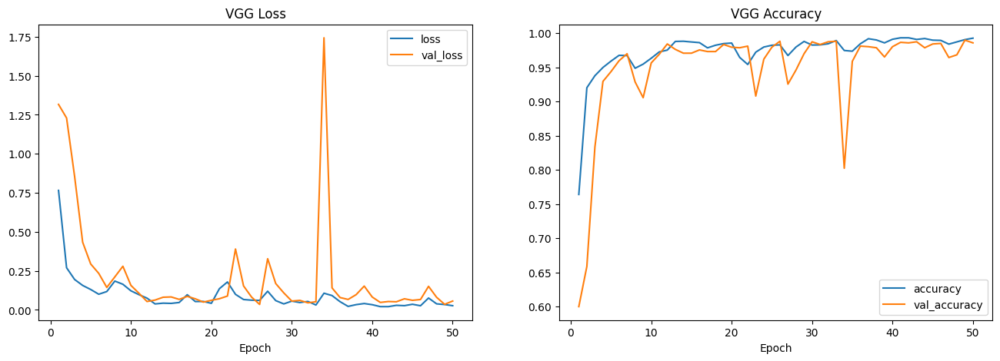

In [22]:
#shows loss and accuracy graph
epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history_vgg.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history_vgg.history['val_loss'],label='val_loss')
ax[0].set_title('VGG Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
# ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history_vgg.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history_vgg.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('VGG Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
# ax[1].set_ylim(0.5,1.5)

plt.show()

berdasarkan grafik yang ditampilkan, performa model menunjukkan hasil yang goodfit namun terdapat gradient problem yaitu exploding pada data validasi.

In [23]:
#train evaluation
trainvgg_loss, trainvgg_acc = base_model.evaluate(train_gen)
print(f'Train loss VGG: {trainvgg_loss:.4f}')
print(f'Train accuracy VGG: {trainvgg_acc:.4f}')

#val evaluation
valvgg_loss, valvgg_acc = base_model.evaluate(val_gen)
print(f'Val loss VGG: {valvgg_loss:.4f}')
print(f'Val accuracy VGG: {valvgg_acc:.4f}')

120/120 [==============================] - 31s 255ms/step - loss: 0.0105 - accuracy: 0.9963
Train loss VGG: 0.0105
Train accuracy VGG: 0.9963
24/24 [==============================] - 13s 527ms/step - loss: 0.0587 - accuracy: 0.9873
Val loss VGG: 0.0587
Val accuracy VGG: 0.9873


Diketahui bahwa pada train-set, model VGG memiliki nilai loss 0.1 dan nilai akurasi 0.99. sedangkan pada val-set nilai lossnya yaitu 0.05 dan nilai akurasinya 0.98. Hasil ini menunjukkan model memiliki kesalahan eror sebanyak 5% dan akurasi 99% dengan performa goodfit. Selain itu, nilai akurasi pada model ini lebih tinggi daripada model sequential sebelumnya serta nilai loss yang lebih rendah.

In [24]:
#shows classification report from test-set
predvgg = base_model.predict(test_gen)
predvgg = np.argmax(predvgg, axis=1)
true = test_gen.labels

print(classification_report(true,predvgg))

24/24 [==============================] - 7s 267ms/step
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       200
           1       0.99      0.99      0.99       200
           2       0.99      1.00      0.99       200
           3       0.98      0.98      0.98       200
           4       1.00      1.00      1.00       200
           5       1.00      1.00      1.00       200
           6       0.99      0.99      0.99       200
           7       0.98      1.00      0.99       200
           8       0.97      1.00      0.98       200
           9       0.97      0.96      0.97       200
          10       0.99      0.97      0.98       200
          11       0.97      1.00      0.98       200
          12       1.00      0.98      0.99       200
          13       1.00      0.98      0.99       200
          14       0.99      0.95      0.97       200

    accuracy                           0.99      3000
   macro avg       0.99  

Pada test-set, model memiliki nilai akurasi sebesar 99% dimana hasil ini tidak berbeda dengan train dan val set.

### Predict

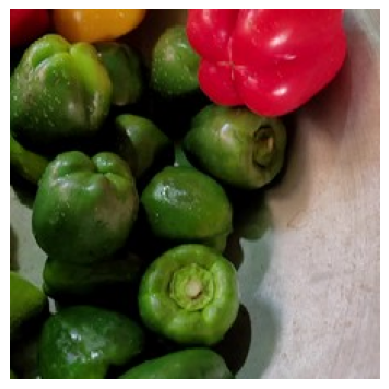

1/1 [==============================] - 1s 624ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Max Class  :  6
Class Name :  Capsicum



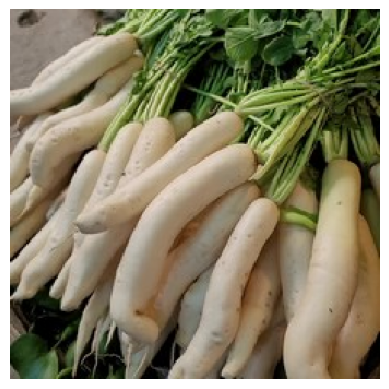

1/1 [==============================] - 0s 20ms/step
Result     :  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Max Class  :  13
Class Name :  Radish



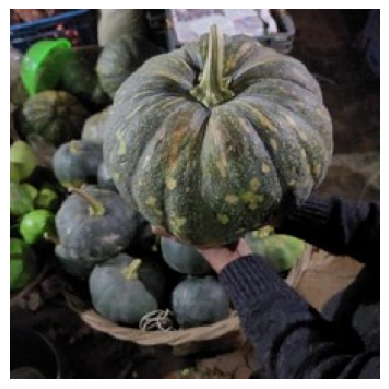

1/1 [==============================] - 0s 19ms/step
Result     :  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 1.2662193e-12 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 2.6024007e-03 0.0000000e+00
  0.0000000e+00 0.0000000e+00 9.9739766e-01 0.0000000e+00 0.0000000e+00]]
Max Class  :  12
Class Name :  Pumpkin



In [25]:
#define image size
img_height = 255
img_width = 255

#choose random images from test-set
img_paths = ['/content/Vegetable Images/test/Capsicum/1004.jpg',
             '/content/Vegetable Images/test/Radish/1043.jpg',
             '/content/Vegetable Images/test/Pumpkin/1129.jpg']

for filename in img_paths:
  img = image.load_img(filename, target_size=(img_height, img_width))
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_batch = np.expand_dims(img_array, axis=0)

  #predict
  prediction = base_model.predict(img_batch)
  result_max_proba = prediction.argmax(axis=-1)[0]
  result_class = class_names[result_max_proba]

  print('Result     : ', prediction)
  print('Max Class  : ', result_max_proba)
  print('Class Name : ', result_class)
  print('')

Dari 3 random gambar yang sama dengan yang digunakan untuk prediksi model Sequential, model VGG dapat memprediksi benar semua yaitu Capsicum dan Radish, dan Pumpkin.

# **Conclusion**

Untuk membuat sebuah model prediksi-klasifikasi sayuran (Bean, Bitter_Gourd, Bottle_Gourd Brinjal, Broccoli, Cabbage, Capsicum, Carrot, Cauliflower, Cucumber, Papaya, Potato, Pumpkin, Radish, dan Tomato), dilakukan tes ke dalam 2 model yang berbeda yaitu `Sequential` dan `VGG16` yang ditambahkan custom layer untuk optimalisasi model.
- Pada model `sequential`, didapatkan hasil bahwa model memiliki akurasi sebesar 85% dan memiliki nilai loss 46%. Dari 3 gambar random yang dipilih untuk prediksi, model dapat memprediksi benar sebanyak 2 gambar.
- Sedangkan pada model `VGG16`, didapatkan hasil akurasi sebesar 99% serta nilai loss sebesar 5%. Dari 3 gambar random yang sama untuk prediksi pada model sequential, model dapat memprediksi benar semua gambar.
- Sehingga didapatkan bahwa model `VGG16` adalah model yang terbaik karena memiliki akurasi tertinggi dan loss terrendah. Kedua model sama-sama memiliki gradient problem yaitu eksploding. Pada model VGG16, sudah ditambahkan batchnormalization untuk mencegah hal tersebut. sehingga untuk improvement model perlu ditambahkan normalisasi dengan cara lain sehingga mendapatkan hasil yang optimal

Kemudian, melakukan efisiensi dengan pengurangan SDM dan digantikan oleh mesin yang dilatih dengan model deep learning adalah hal yang baik untuk dilakukan. Namun perlu diketahui bahwa untuk melakukan pemilihan sayuran, model membutuhkan waktu yang sedikit lebih lama dibandingkan manusia pada umumnya. Sehingga diperlukan beberapa mesin untuk efisiensi waktu. 

# Save Model

In [26]:
# Save Model
base_model.save('model_vgg.h5')